## Notebook 1: Exploratory Data Analysis

In [1]:
#!pip install pandas numpy matplotlib seaborn scikit-learn pillow opencv-python -q
#!pip install torch torchvision albumentations timm tqdm tensorboard -q

print(" All packages installed!")

 All packages installed!


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import json
from collections import Counter
import warnings
warnings.filterwarnings('ignore')

# Image processing
from PIL import Image
import cv2

# Set style
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (12, 6)

In [3]:
DATA_DIR = Path("data")  # Main data directory
TRAIN_FEATURES_DIR = DATA_DIR / "train_features"
TEST_FEATURES_DIR = DATA_DIR / "test_features"

# CSV files
TRAIN_FEATURES_CSV = DATA_DIR / "train_features.csv"
TRAIN_LABELS_CSV = DATA_DIR / "train_labels.csv"
TEST_FEATURES_CSV = DATA_DIR / "test_features.csv"

# Create output directories
OUTPUT_DIR = Path("outputs")
OUTPUT_DIR.mkdir(exist_ok=True)
(OUTPUT_DIR / "visualizations").mkdir(exist_ok=True)
(OUTPUT_DIR / "models").mkdir(exist_ok=True)

print(" Directory structure set up")
print(f"   Data directory: {DATA_DIR}")
print(f"   Output directory: {OUTPUT_DIR}")

 Directory structure set up
   Data directory: data
   Output directory: outputs


# Load Data


In [4]:
# Load all CSV files
train_features = pd.read_csv(TRAIN_FEATURES_CSV)
train_labels = pd.read_csv(TRAIN_LABELS_CSV)
test_features = pd.read_csv(TEST_FEATURES_CSV)

print(f" Training features: {len(train_features)} images")
print(f" Training labels: {len(train_labels)} images")
print(f" Test features: {len(test_features)} images")

# Preview data
print("\n--- Train Features Preview ---")
display(train_features.head())

print("\n--- Train Labels Preview ---")
display(train_labels.head())

 Training features: 16488 images
 Training labels: 16488 images
 Test features: 4464 images

--- Train Features Preview ---


,id,filepath,site
0,ZJ000000,train_features/ZJ000000.jpg,S0120
1,ZJ000001,train_features/ZJ000001.jpg,S0069
2,ZJ000002,train_features/ZJ000002.jpg,S0009
3,ZJ000003,train_features/ZJ000003.jpg,S0008
4,ZJ000004,train_features/ZJ000004.jpg,S0036



--- Train Labels Preview ---


,id,antelope_duiker,bird,blank,civet_genet,hog,leopard,monkey_prosimian,rodent
0,ZJ000000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,ZJ000001,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,ZJ000002,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,ZJ000003,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,ZJ000004,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [5]:
print("="*80)
print("BASIC DATA INFORMATION")
print("="*80)

print("\n--- Train Features ---")
print(f"Shape: {train_features.shape}")
print(f"Columns: {list(train_features.columns)}")
print(f"\nData types:\n{train_features.dtypes}")
print(f"\nMissing values:\n{train_features.isnull().sum()}")

print("\n--- Train Labels ---")
print(f"Shape: {train_labels.shape}")
print(f"Columns: {list(train_labels.columns)}")

print("\n--- Test Features ---")
print(f"Shape: {test_features.shape}")

BASIC DATA INFORMATION

--- Train Features ---
Shape: (16488, 3)
Columns: ['id', 'filepath', 'site']

Data types:
id          object
filepath    object
site        object
dtype: object

Missing values:
id          0
filepath    0
site        0
dtype: int64

--- Train Labels ---
Shape: (16488, 9)
Columns: ['id', 'antelope_duiker', 'bird', 'blank', 'civet_genet', 'hog', 'leopard', 'monkey_prosimian', 'rodent']

--- Test Features ---
Shape: (4464, 3)


In [6]:
# Get class names
class_columns = [col for col in train_labels.columns if col != 'id']
print(f"Classes: {class_columns}\n")

# Calculate class distribution
class_counts = {}
for class_name in class_columns:
    class_counts[class_name] = train_labels[class_name].sum()

class_dist = pd.DataFrame.from_dict(class_counts, orient='index', columns=['count'])
class_dist = class_dist.sort_values('count', ascending=False)
class_dist['percentage'] = (class_dist['count'] / len(train_labels) * 100).round(2)

print("--- Class Distribution ---")
display(class_dist)

# Calculate imbalance ratio
max_count = class_dist['count'].max()
min_count = class_dist['count'].min()
imbalance_ratio = max_count / min_count
print(f"\n Class Imbalance Ratio: {imbalance_ratio:.2f}x")
if imbalance_ratio > 3:
    print("   -> Significant imbalance detected. Will need class weights!")

Classes: ['antelope_duiker', 'bird', 'blank', 'civet_genet', 'hog', 'leopard', 'monkey_prosimian', 'rodent']

--- Class Distribution ---


,count,percentage
monkey_prosimian,2492.0,15.11
antelope_duiker,2474.0,15.00
civet_genet,2423.0,14.70
leopard,2254.0,13.67
blank,2213.0,13.42
rodent,2013.0,12.21
bird,1641.0,9.95
hog,978.0,5.93



 Class Imbalance Ratio: 2.55x


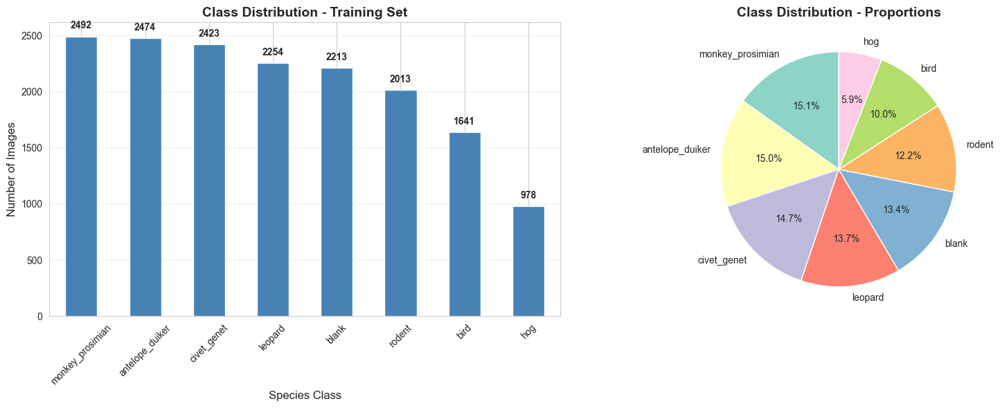

In [7]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Bar plot
class_dist.plot(kind='bar', y='count', ax=ax1, color='steelblue', legend=False)
ax1.set_title('Class Distribution - Training Set', fontsize=14, fontweight='bold')
ax1.set_xlabel('Species Class', fontsize=12)
ax1.set_ylabel('Number of Images', fontsize=12)
ax1.tick_params(axis='x', rotation=45)
ax1.grid(axis='y', alpha=0.3)

# Add value labels on bars
for i, v in enumerate(class_dist['count']):
    ax1.text(i, v + 50, str(int(v)), ha='center', va='bottom', fontweight='bold')

# Pie chart
colors = plt.cm.Set3(range(len(class_dist)))
ax2.pie(class_dist['count'], labels=class_dist.index, autopct='%1.1f%%', 
        startangle=90, colors=colors)
ax2.set_title('Class Distribution - Proportions', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.savefig(OUTPUT_DIR / "visualizations" / "class_distribution.png", dpi=300, bbox_inches='tight')
plt.show()

In [8]:
print("="*80)
print("SITE ANALYSIS")
print("="*80)

# Analyze training sites
train_sites = train_features['site'].value_counts().sort_index()
print(f"\n--- Training Sites ---")
print(f"Number of unique sites: {len(train_sites)}")
print(f"Images per site - Min: {train_sites.min()}, Max: {train_sites.max()}, Mean: {train_sites.mean():.1f}")

# Analyze test sites
test_sites = test_features['site'].value_counts().sort_index()
print(f"\n--- Test Sites ---")
print(f"Number of unique sites: {len(test_sites)}")
print(f"Images per site - Min: {test_sites.min()}, Max: {test_sites.max()}, Mean: {test_sites.mean():.1f}")

# CRITICAL: Verify no site overlap
site_overlap = set(train_features['site'].unique()) & set(test_features['site'].unique())
print(f"\n Site overlap between train and test: {len(site_overlap)} sites")
if len(site_overlap) > 0:
    print(f" WARNING: Found overlapping sites: {site_overlap}")
else:
    print("   -> Good! Train and test sites are completely separate.")
    print("   -> This means model must generalize to NEW locations!")

SITE ANALYSIS

--- Training Sites ---
Number of unique sites: 148
Images per site - Min: 1, Max: 1132, Mean: 111.4

--- Test Sites ---
Number of unique sites: 51
Images per site - Min: 1, Max: 495, Mean: 87.5

 Site overlap between train and test: 0 sites
   -> Good! Train and test sites are completely separate.
   -> This means model must generalize to NEW locations!


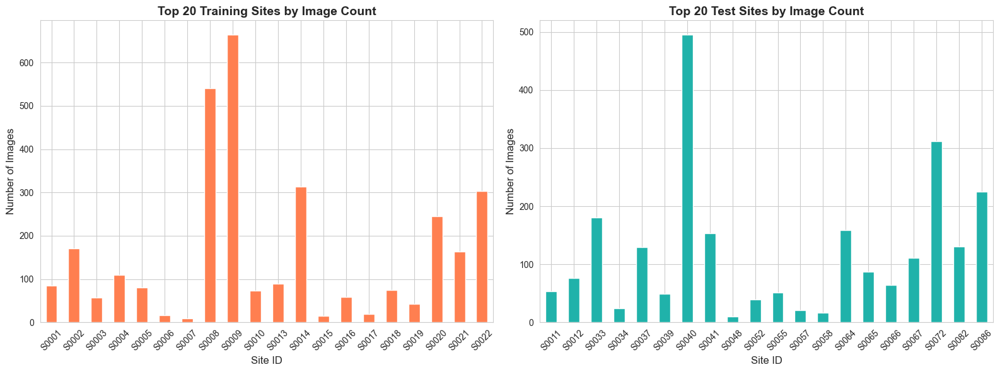

In [9]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Training sites
train_sites.head(20).plot(kind='bar', ax=ax1, color='coral')
ax1.set_title('Top 20 Training Sites by Image Count', fontsize=14, fontweight='bold')
ax1.set_xlabel('Site ID', fontsize=12)
ax1.set_ylabel('Number of Images', fontsize=12)
ax1.tick_params(axis='x', rotation=45)

# Test sites
test_sites.head(20).plot(kind='bar', ax=ax2, color='lightseagreen')
ax2.set_title('Top 20 Test Sites by Image Count', fontsize=14, fontweight='bold')
ax2.set_xlabel('Site ID', fontsize=12)
ax2.set_ylabel('Number of Images', fontsize=12)
ax2.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.savefig(OUTPUT_DIR / "visualizations" / "site_distribution.png", dpi=300, bbox_inches='tight')
plt.show()

In [10]:
def analyze_image_properties(image_dir, sample_size=100):
    """Analyze properties of a sample of images"""
    image_files = list(Path(image_dir).glob("*.jpg"))[:sample_size]
    
    widths, heights, aspects, sizes = [], [], [], []
    
    for img_path in image_files:
        try:
            img = Image.open(img_path)
            w, h = img.size
            widths.append(w)
            heights.append(h)
            aspects.append(w/h)
            sizes.append(img_path.stat().st_size / 1024)  # KB
        except Exception as e:
            print(f"Error reading {img_path}: {e}")
    
    return {
        'width': widths,
        'height': heights,
        'aspect_ratio': aspects,
        'size_kb': sizes
    }

# Analyze sample of training images
print(f"Analyzing sample of training images from: {TRAIN_FEATURES_DIR}")
if TRAIN_FEATURES_DIR.exists():
    props = analyze_image_properties(TRAIN_FEATURES_DIR, sample_size=100)
    
    print(f"\n--- Image Properties (sample of 100) ---")
    print(f"Width  - Min: {min(props['width'])}, Max: {max(props['width'])}, Mean: {np.mean(props['width']):.1f}")
    print(f"Height - Min: {min(props['height'])}, Max: {max(props['height'])}, Mean: {np.mean(props['height']):.1f}")
    print(f"Aspect - Min: {min(props['aspect_ratio']):.2f}, Max: {max(props['aspect_ratio']):.2f}, Mean: {np.mean(props['aspect_ratio']):.2f}")
    print(f"Size   - Min: {min(props['size_kb']):.1f}KB, Max: {max(props['size_kb']):.1f}KB, Mean: {np.mean(props['size_kb']):.1f}KB")
else:
    print(f" Warning: Image directory not found at {TRAIN_FEATURES_DIR}")
    props = None

Analyzing sample of training images from: data/train_features

--- Image Properties (sample of 100) ---
Width  - Min: 160, Max: 960, Mean: 736.8
Height - Min: 120, Max: 540, Mean: 415.4
Aspect - Min: 1.33, Max: 1.91, Mean: 1.76
Size   - Min: 1.2KB, Max: 97.9KB, Mean: 30.5KB


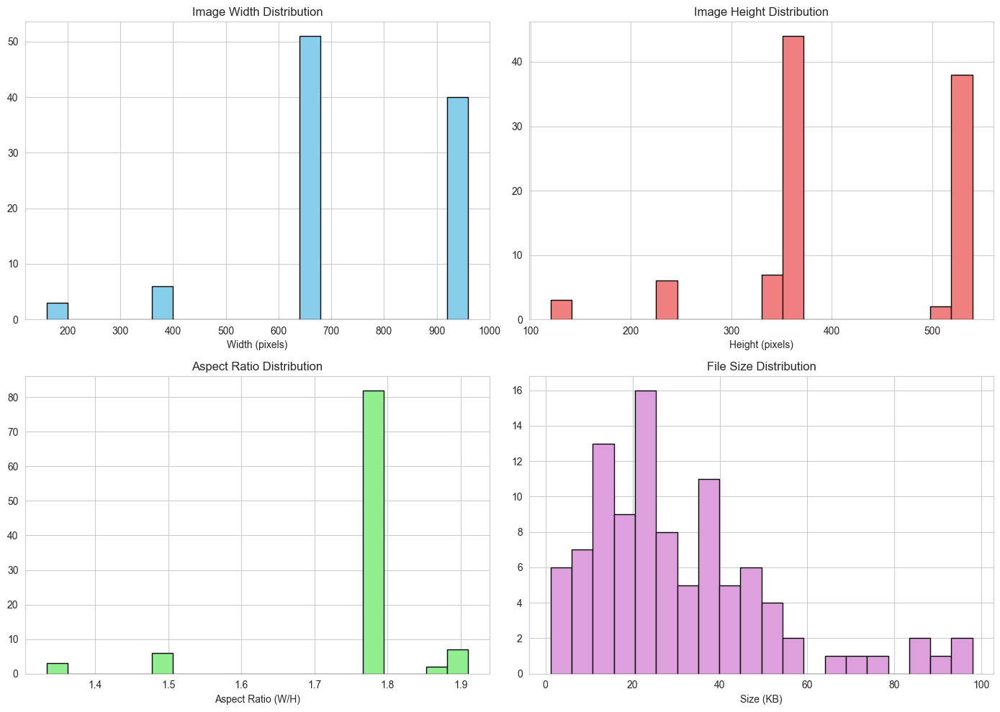

In [11]:
if props is not None:
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    
    axes[0, 0].hist(props['width'], bins=20, color='skyblue', edgecolor='black')
    axes[0, 0].set_title('Image Width Distribution')
    axes[0, 0].set_xlabel('Width (pixels)')
    
    axes[0, 1].hist(props['height'], bins=20, color='lightcoral', edgecolor='black')
    axes[0, 1].set_title('Image Height Distribution')
    axes[0, 1].set_xlabel('Height (pixels)')
    
    axes[1, 0].hist(props['aspect_ratio'], bins=20, color='lightgreen', edgecolor='black')
    axes[1, 0].set_title('Aspect Ratio Distribution')
    axes[1, 0].set_xlabel('Aspect Ratio (W/H)')
    
    axes[1, 1].hist(props['size_kb'], bins=20, color='plum', edgecolor='black')
    axes[1, 1].set_title('File Size Distribution')
    axes[1, 1].set_xlabel('Size (KB)')
    
    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / "visualizations" / "image_properties.png", dpi=300, bbox_inches='tight')
    plt.show()

Visualizing samples from each class...

Class: antelope_duiker


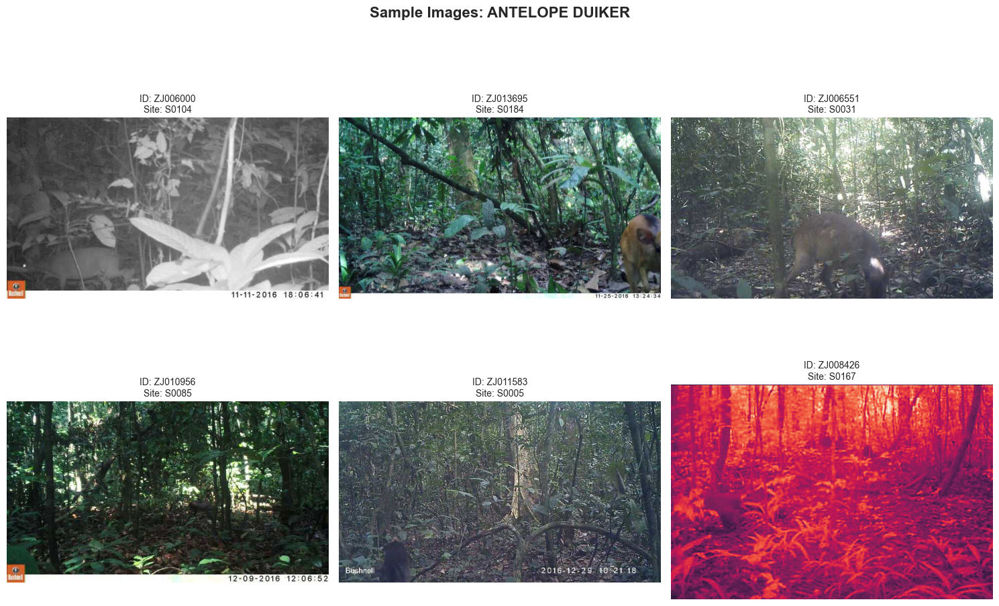

Class: bird


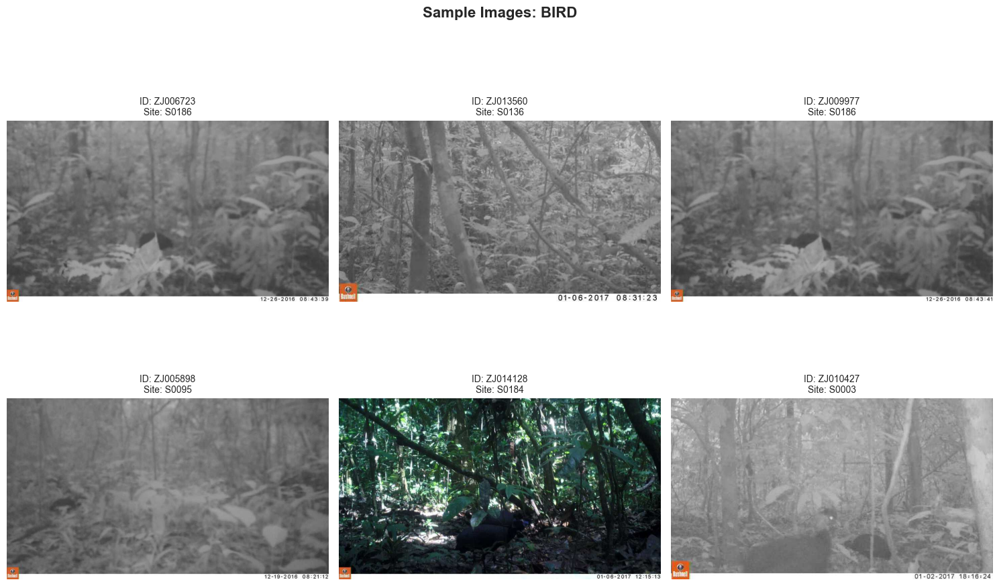

Class: blank


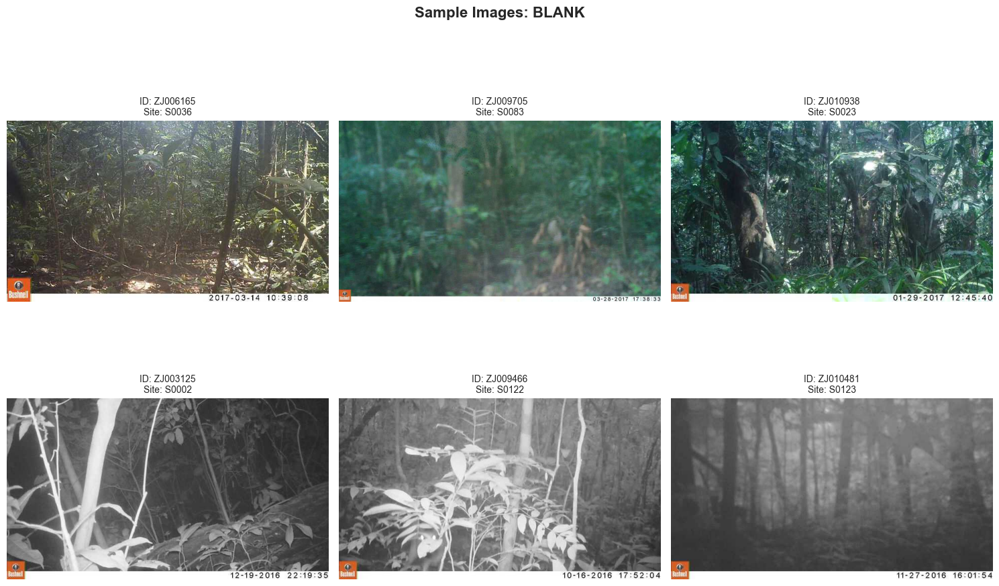

Class: civet_genet


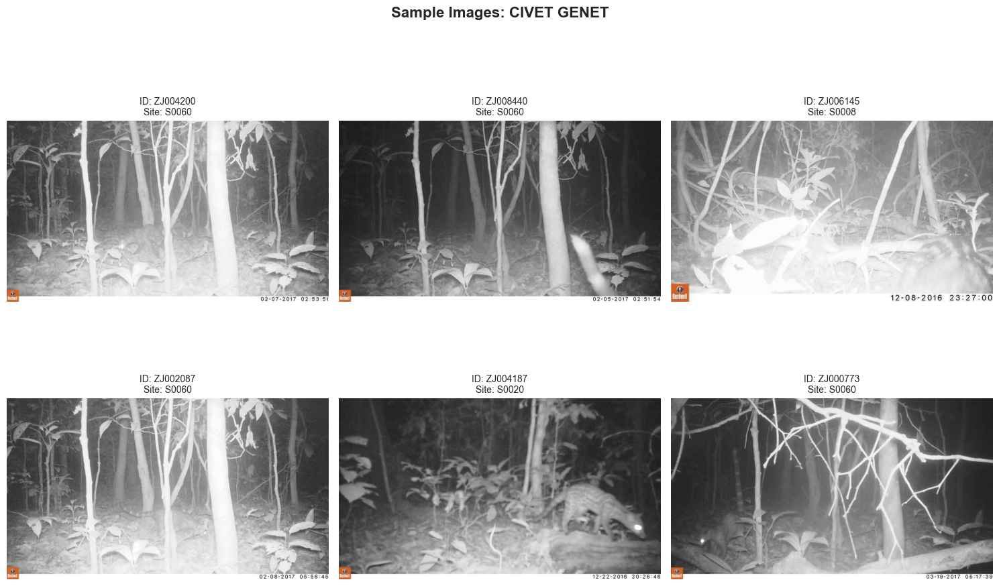

Class: hog


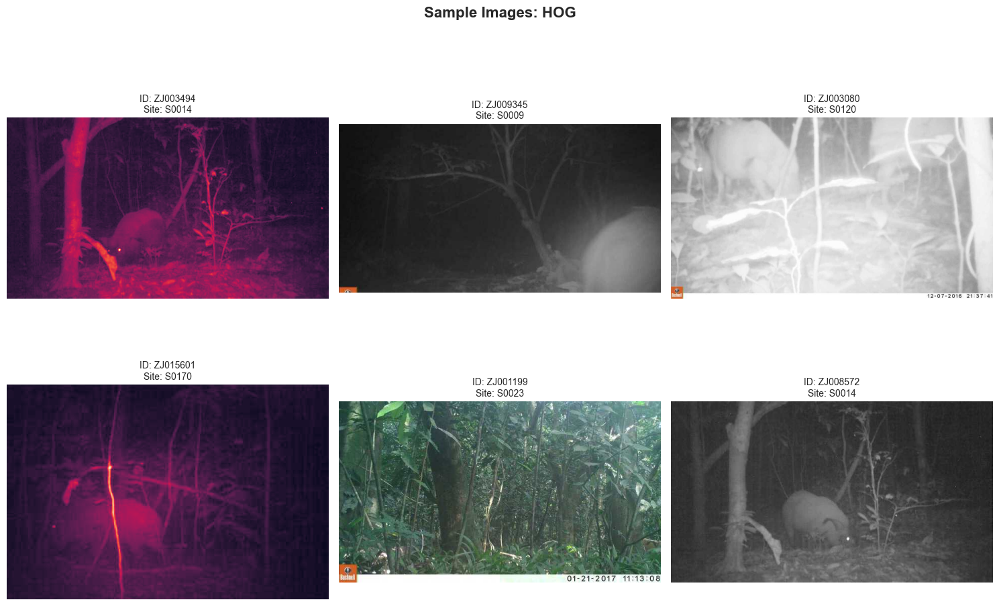

Class: leopard


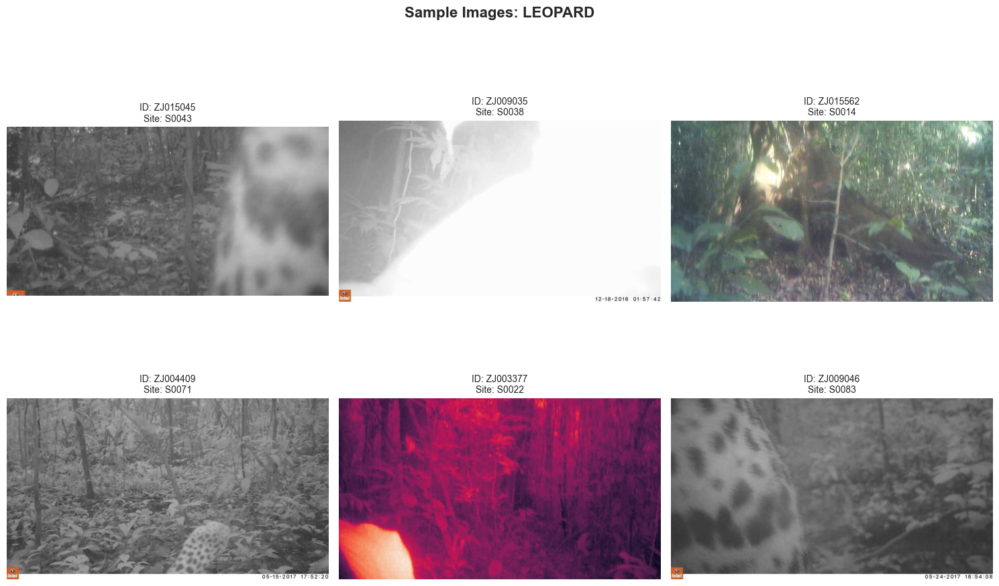

Class: monkey_prosimian


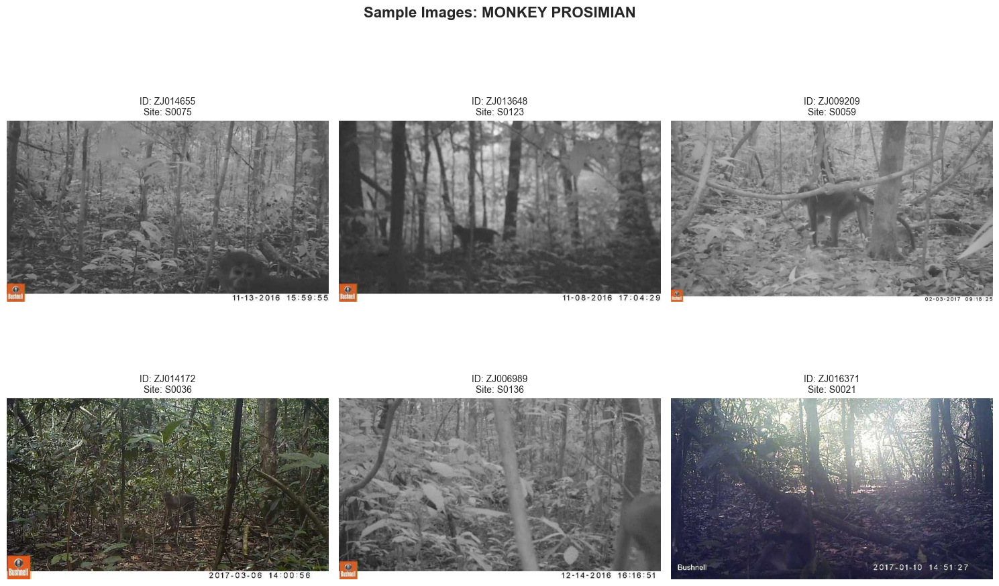

Class: rodent


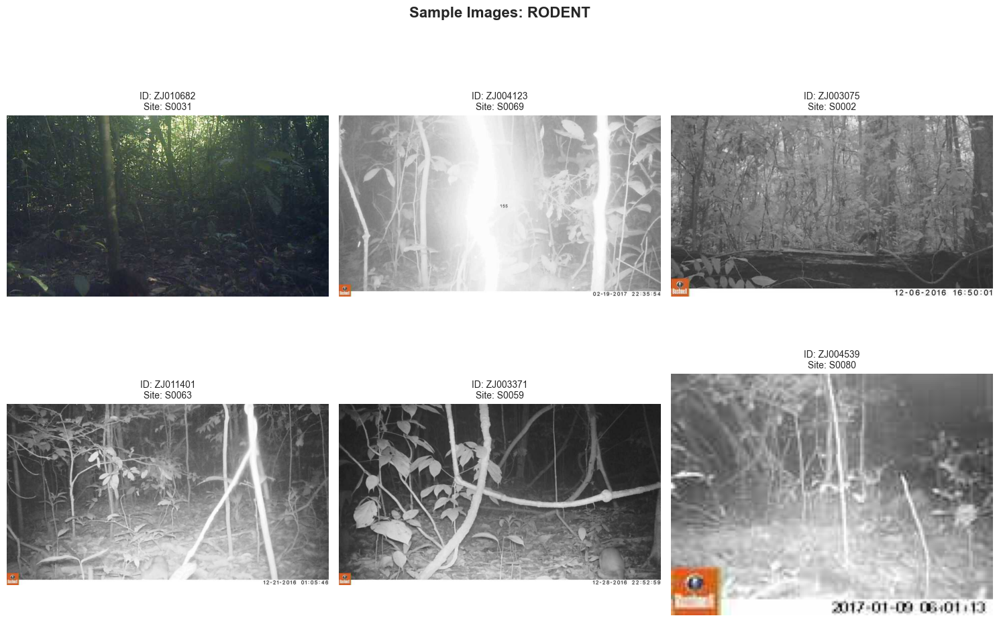

In [12]:
# Merge features and labels
train_data = train_features.merge(train_labels, on='id')

# Function to show samples from a class
def show_class_samples(class_name, num_samples=6):
    """Visualize random samples from a specific class"""
    
    class_images = train_data[train_data[class_name] == 1]
    
    if len(class_images) == 0:
        print(f"No images found for class: {class_name}")
        return
    
    # Sample random images
    num_samples = min(num_samples, len(class_images))
    samples = class_images.sample(n=num_samples, random_state=42)
    
    # Create figure
    cols = 3
    rows = (num_samples + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(15, 5*rows))
    if num_samples == 1:
        axes = [axes]
    else:
        axes = axes.flatten()
    
    fig.suptitle(f'Sample Images: {class_name.upper().replace("_", " ")}', 
                 fontsize=16, fontweight='bold', y=0.995)
    
    for idx, (_, row) in enumerate(samples.iterrows()):
        if idx >= len(axes):
            break
            
        img_path = DATA_DIR / row['filepath']
        
        try:
            img = Image.open(img_path)
            axes[idx].imshow(img)
            axes[idx].axis('off')
            axes[idx].set_title(f"ID: {row['id']}\nSite: {row['site']}", fontsize=10)
        except Exception as e:
            axes[idx].text(0.5, 0.5, f'Error loading\n{row["id"]}', 
                          ha='center', va='center')
            axes[idx].axis('off')
    
    # Hide extra subplots
    for idx in range(len(samples), len(axes)):
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()

# Show samples from each class
print("Visualizing samples from each class...\n")
for class_name in class_columns:
    print(f"Class: {class_name}")
    show_class_samples(class_name, num_samples=6)

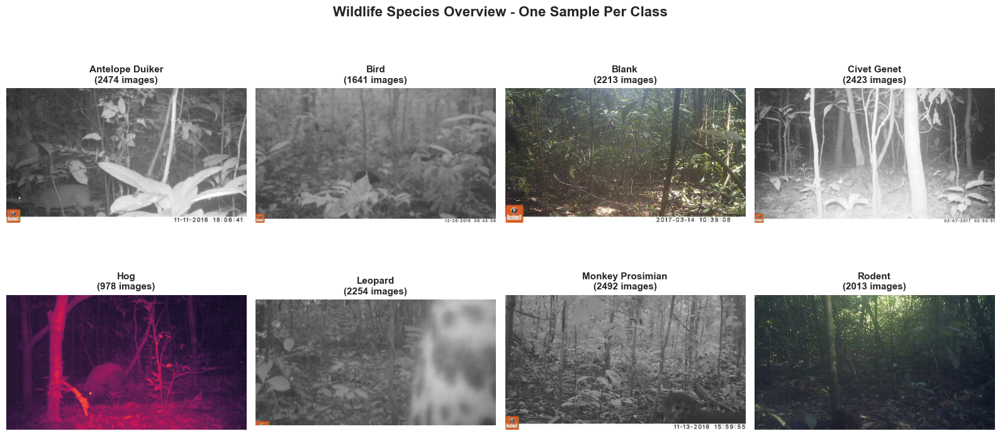

In [13]:
# Create overview with one image per class
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.flatten()

fig.suptitle('Wildlife Species Overview - One Sample Per Class', 
             fontsize=16, fontweight='bold')

for idx, class_name in enumerate(class_columns):
    class_images = train_data[train_data[class_name] == 1]
    
    if len(class_images) > 0:
        sample = class_images.sample(n=1, random_state=42).iloc[0]
        img_path = DATA_DIR / sample['filepath']
        
        try:
            img = Image.open(img_path)
            axes[idx].imshow(img)
            axes[idx].set_title(f"{class_name.replace('_', ' ').title()}\n({int(class_images.shape[0])} images)", 
                               fontsize=11, fontweight='bold')
            axes[idx].axis('off')
        except Exception as e:
            axes[idx].text(0.5, 0.5, f'Error loading\n{class_name}', 
                          ha='center', va='center')
            axes[idx].axis('off')
    else:
        axes[idx].axis('off')

plt.tight_layout()
plt.savefig(OUTPUT_DIR / "visualizations" / "class_overview.png", dpi=300, bbox_inches='tight')
plt.show()

In [14]:
summary = {
    'total_train_images': len(train_features),
    'total_test_images': len(test_features),
    'num_classes': len(class_columns),
    'classes': class_columns,
    'class_distribution': {k: int(v) for k, v in class_counts.items()},
    'num_train_sites': len(train_features['site'].unique()),
    'num_test_sites': len(test_features['site'].unique()),
    'site_overlap': len(site_overlap),
    'imbalance_ratio': float(imbalance_ratio)
}

with open(OUTPUT_DIR / 'data_summary.json', 'w') as f:
    json.dump(summary, f, indent=2)

print(" Summary statistics saved to:", OUTPUT_DIR / 'data_summary.json')

 Summary statistics saved to: outputs/data_summary.json
